# Demo

Contents:

1. Layer-wise Relevance Propagation (LRP)
1. Quantitative evaluation of LRP explanation using Region Perturbation (perturbation modes: inpainting, random)

## LRP

Files already downloaded and verified


/Users/garvitchugh/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/garvitchugh/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Activation of features.0: tensor([[[[ 0.4409,  0.4368,  0.4368,  ...,  0.4515,  0.4515,  0.3850],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          ...,
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.6385,  0.4956,  0.4956,  ...,  0.4698,  0.4698,  0.4119]],

         [[ 1.8858,  0.6493,  0.6493,  ...,  0.6765,  0.6765, -0.6925],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          ...,
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 0.4862, -0.5840, -0.5840,  ..., -0.4907, -0.4907, -1.1655]],

         [[-0.3160, -0.7284, -0.7284,  ..., -0.8614, -0.8614, -1.8319],
    

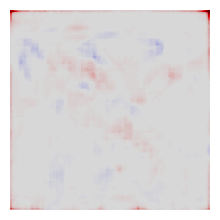

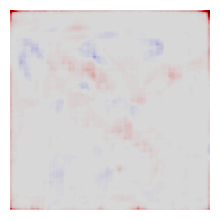

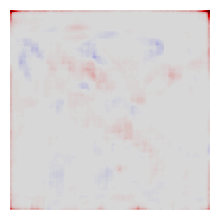

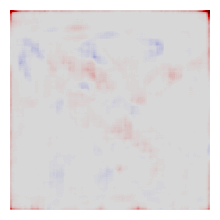

In [20]:
from typing import Callable, Dict, List, Tuple, Union

import numpy
import torch
import torchvision
from matplotlib import pyplot as plt
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

import lrp.plot
from lrp import image, rules
from lrp.core import LRP
from lrp.filter import LayerFilter
from lrp.rules import LrpEpsilonRule, LrpGammaRule, LrpZBoxRule, LrpZeroRule
from lrp.zennit.types import AvgPool, Linear

# Load CIFAR-10 Dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for VGG16
    transforms.ToTensor(),
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4, shuffle=True)



# Input data
# Image is in RGB mode with range [0,1]
# img_bgr_hwc_float_0_1: numpy.array = image.load_img_norm_zero_one('data/castle.jpg')
# X = lrp.norm.ImageNetNorm.transform(img_bgr_hwc_float_0_1)

# Simulate batch by adding a new dimension so that X is in NCHW format
# N is the batch size
# C is the number of channels
# H is the height
# W is the width
# X = torch.unsqueeze(X, 0)

# Hide plot axes
# plt.axis('off')

# Plot input image
# lrp.plot.plot_imagenet(X)

# Model
# Modify VGG16 for CIFAR-10
model = torchvision.models.vgg16(pretrained=True)
model.classifier[6] = torch.nn.Linear(4096, 10)  # Adjust the classifier for 10 CIFAR-10 classes
model.eval()

# Function to print activation values
def get_activation(name):
    def hook(model, input, output):
        print(f"Activation of {name}: {output.detach()}")
    return hook

# Register hooks to print activation values
for name, layer in model.named_modules():
    if isinstance(layer, torch.nn.Conv2d) or isinstance(layer, torch.nn.Linear):
        layer.register_forward_hook(get_activation(name))


# Low and high parameters for zB-rule
batch_size: int = 1
shape: Tuple[int] = (batch_size, 3, 224, 224)

low: torch.Tensor = lrp.norm.ImageNetNorm.normalize(torch.zeros(*shape))
high: torch.Tensor = lrp.norm.ImageNetNorm.normalize(torch.ones(*shape))

# Init layer filter
target_types: Tuple[type] = (Linear, AvgPool)
filter_by_layer_index_type: LayerFilter = LayerFilter(model=model,
                                                      target_types=target_types)

name_map: List[Tuple[List[str], rules.LrpRule,
                     Dict[str, Union[torch.Tensor, float]]]]

# LRP Composite from Montavon's lrp-tutorial
name_map = [
    (filter_by_layer_index_type(lambda n: n == 0), LrpZBoxRule, {'low': low, 'high': high}),
    (filter_by_layer_index_type(lambda n: 1 <= n <= 16), LrpGammaRule, {'gamma': 0.25}),
    (filter_by_layer_index_type(lambda n: 17 <= n <= 30), LrpEpsilonRule, {'epsilon': 0.25}),
    (filter_by_layer_index_type(lambda n: 31 <= n), LrpZeroRule, {}),
]

# Init LRP
lrp_instance: LRP = LRP(model)

# Prepare model layers for LRP
lrp_instance.convert_layers(name_map)

# Compute relevance attributions
# R: torch.Tensor = lrp_instance.relevance(X)

# Get a batch of images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# Forward pass to trigger hooks and get output (for printing activation values)
output = model(images)

# Compute relevance attributions for CIFAR-10 images
R = lrp_instance.relevance(images)


# Display heatmap
lrp_instance.heatmap(R, width=2, height=2)

### LRP-modified Model

We will print the LRP-modified model to console. You will see that some layers were replaced with LRP layers.

In [21]:
lrp_instance.model

VGG(
  (features): Sequential(
    (0): LrpZBoxRule(
      (layer): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (low_layer): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (high_layer): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): ReLU(inplace=True)
    (2): LrpGammaRule(
      (layer): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (copy_layer): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): LrpGammaRule(
      (layer): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (copy_layer): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (6): ReLU(inplace=True)
    (7): LrpGammaRule(
      (layer): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (copy_layer): Conv

In [22]:
for layers, rule, params in name_map:
    for layer in layers:
        print(f'{layer} {rule.__name__}')

features.0 LrpZBoxRule
features.2 LrpGammaRule
features.5 LrpGammaRule
features.7 LrpGammaRule
features.10 LrpGammaRule
features.12 LrpGammaRule
features.14 LrpGammaRule
features.17 LrpEpsilonRule
features.19 LrpEpsilonRule
features.21 LrpEpsilonRule
features.24 LrpEpsilonRule
features.26 LrpEpsilonRule
features.28 LrpEpsilonRule
avgpool LrpZeroRule
classifier.0 LrpZeroRule
classifier.3 LrpZeroRule
classifier.6 LrpZeroRule


## Region Perturbation

### Perturbation Mode: Inpainting

Activation of features.0: tensor([[[[ 0.4409,  0.4368,  0.4368,  ...,  0.4515,  0.4515,  0.3850],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          ...,
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.6385,  0.4956,  0.4956,  ...,  0.4698,  0.4698,  0.4119]],

         [[ 1.8858,  0.6493,  0.6493,  ...,  0.6765,  0.6765, -0.6925],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          ...,
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 0.4862, -0.5840, -0.5840,  ..., -0.4907, -0.4907, -1.1655]],

         [[-0.3160, -0.7284, -0.7284,  ..., -0.8614, -0.8614, -1.8319],
    

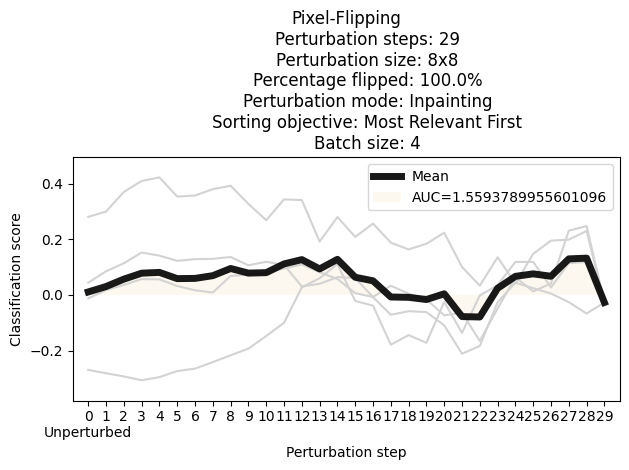

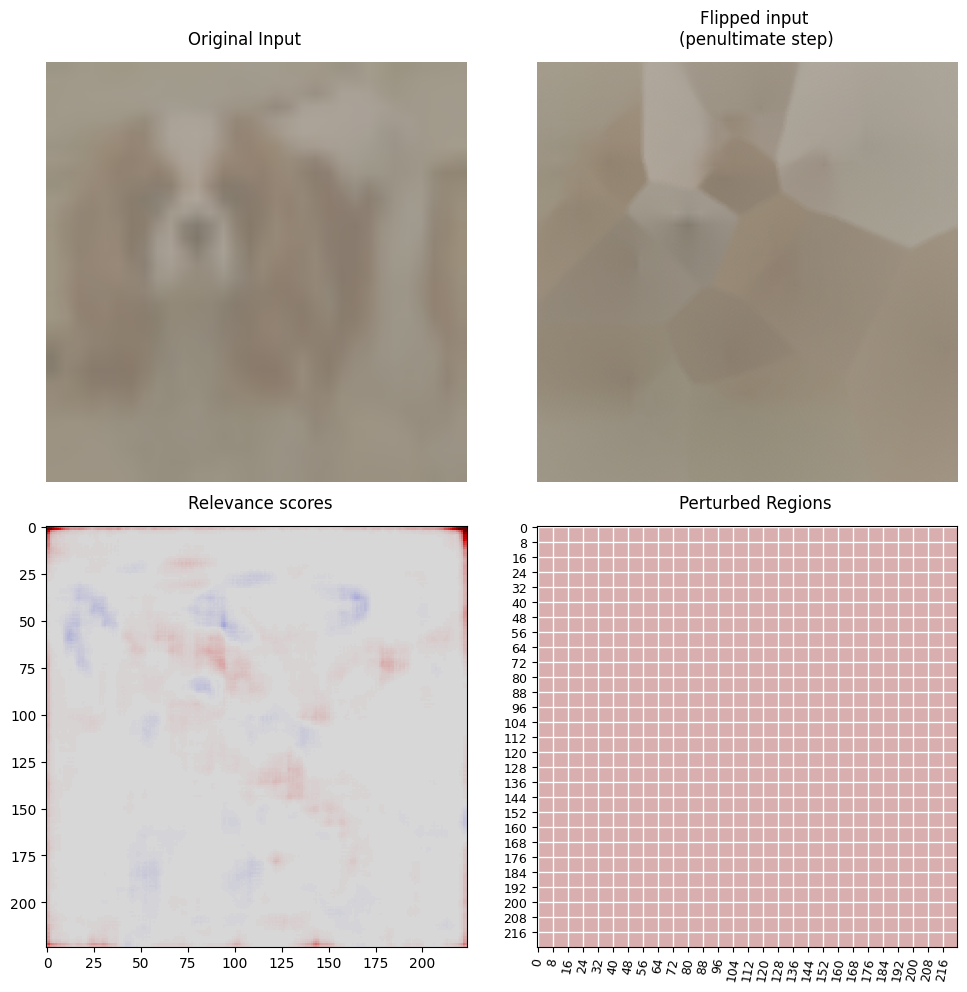

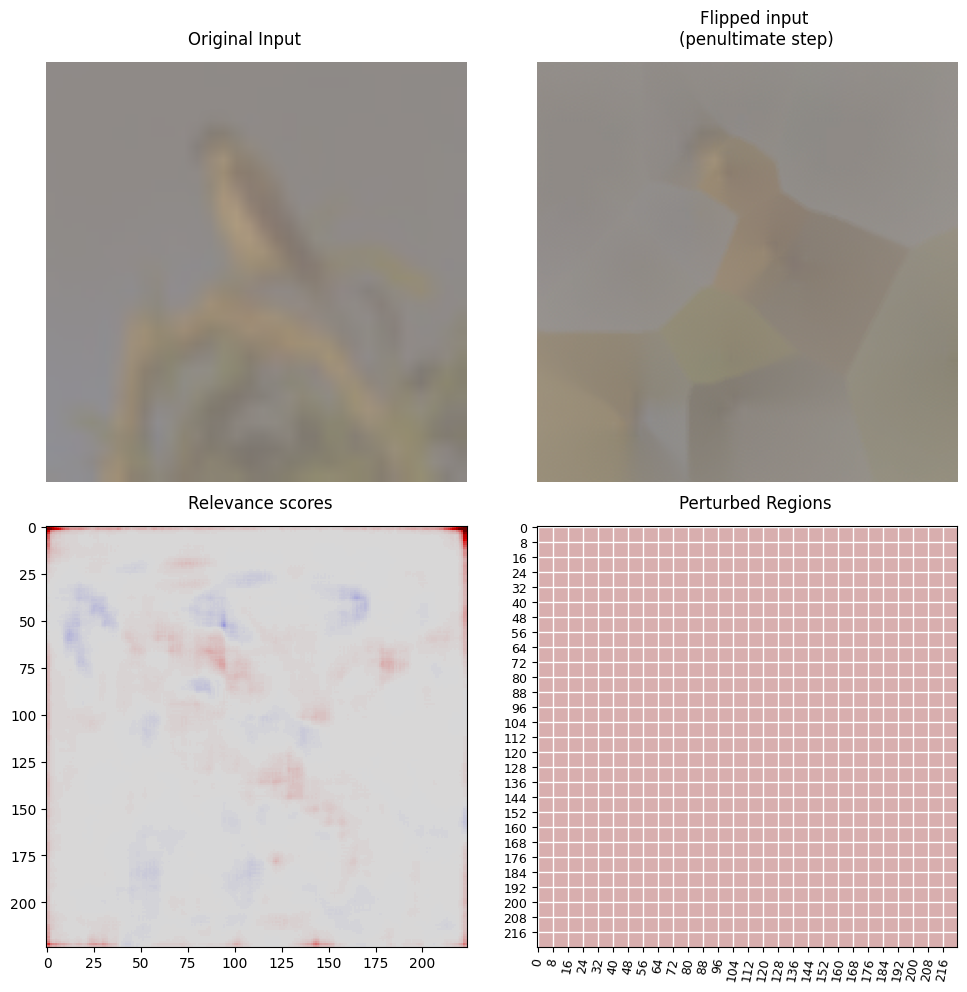

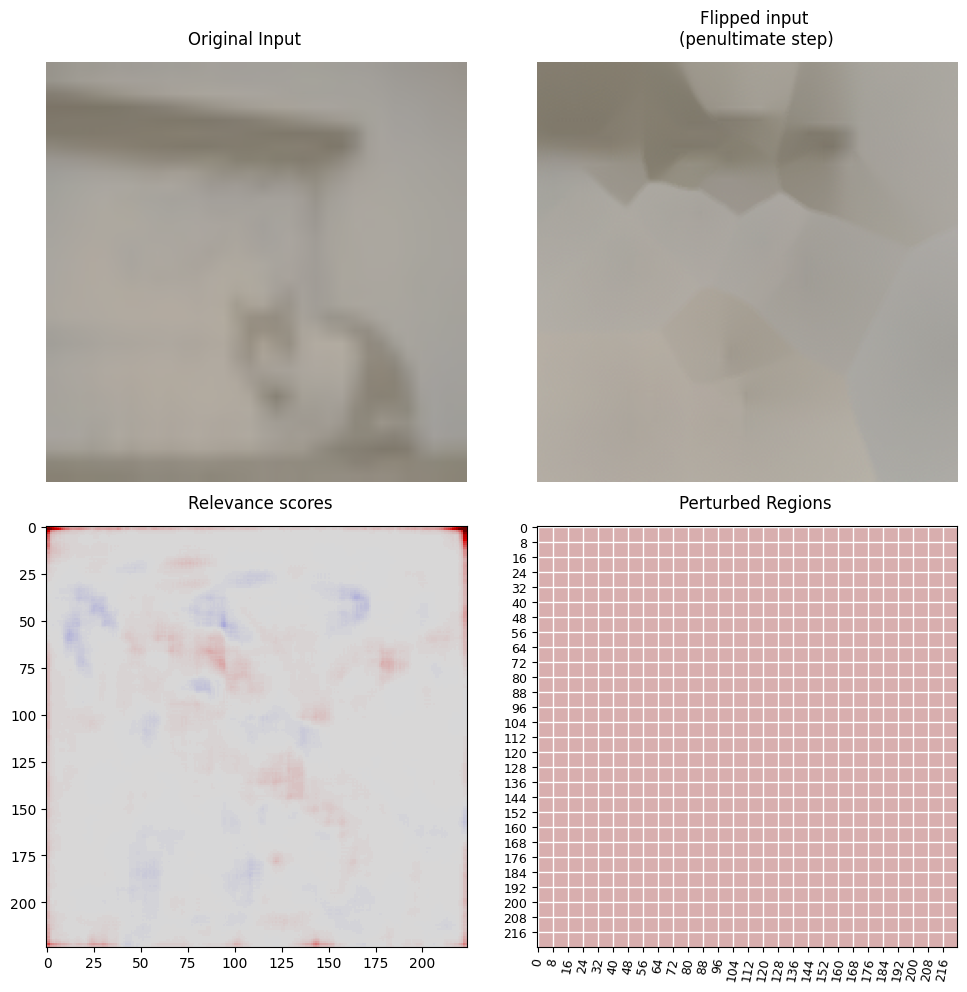

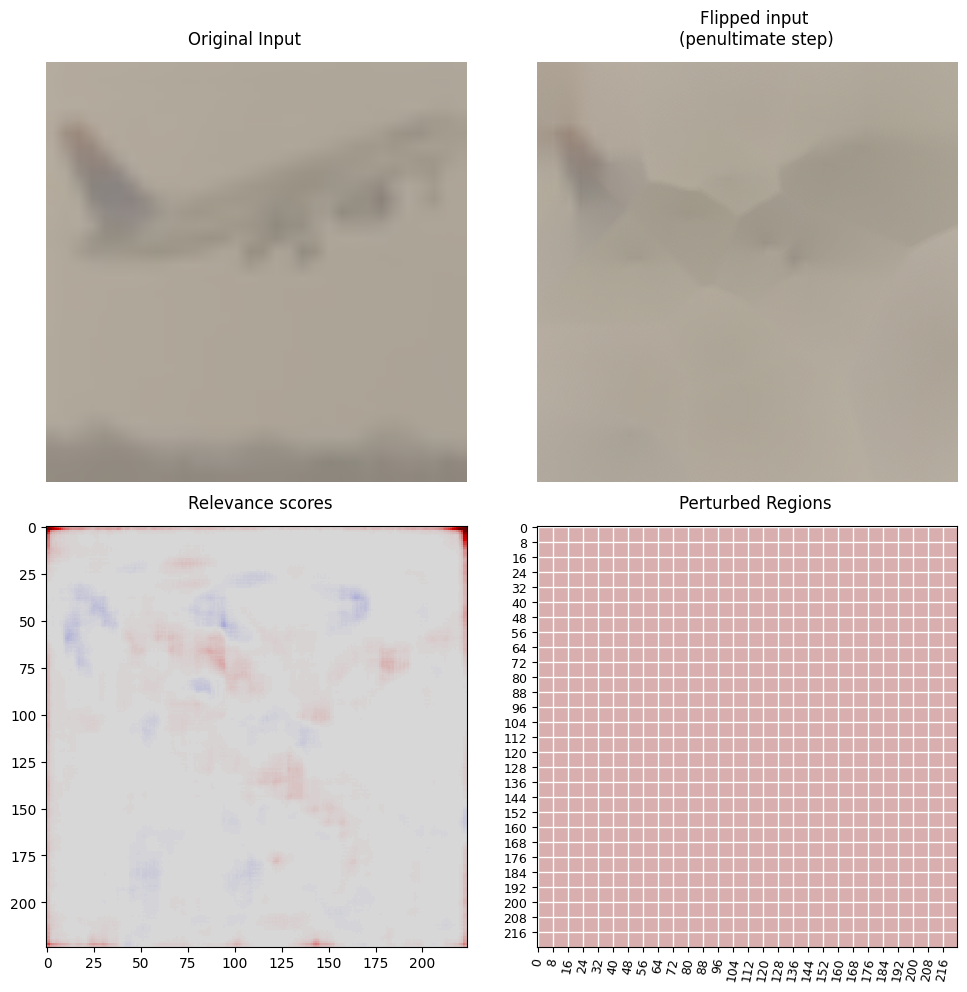

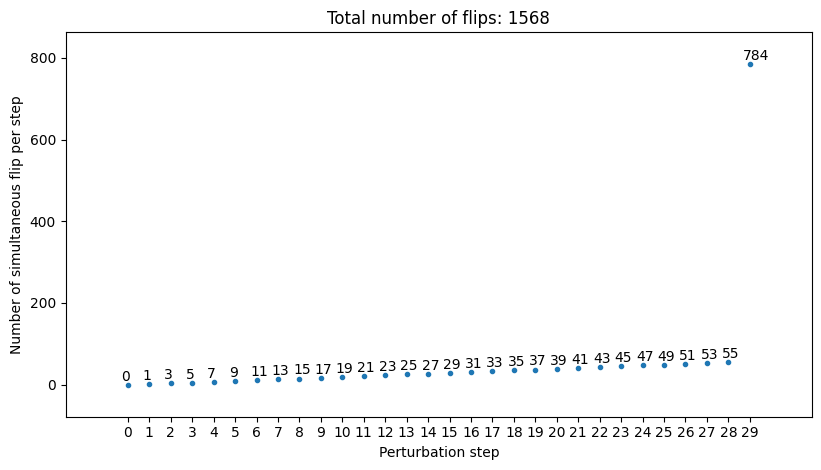

In [23]:
from pf.core import PixelFlipping
from pf.perturbation_modes.constants import PerturbModes
from typing import Callable

# Set parameters for the Pixel-Flipping algorithm
perturbation_steps: int = 29
perturbation_size: int = 8
perturb_mode: str = PerturbModes.INPAINTING  # or PerturbModes.RANDOM

# Create an instance of PixelFlipping
pixel_flipping_instance: PixelFlipping = PixelFlipping(
    perturbation_steps=perturbation_steps,
    perturbation_size=perturbation_size,
    perturb_mode=perturb_mode
)

# Clone the input and relevance scores
input_nchw: torch.Tensor = images.clone().detach()
relevance_scores_nchw: torch.Tensor = R.clone().detach()

# Function to return the classification score for the given input
# Adjust the index for CIFAR-10 classes (0 to 9)

# Example for class 'Cat' with index 3
class_index = 3  # Adjust this index based on the class you want to analyze


def forward_pass(input_nchw): 
    return model(input_nchw)[:, class_index] 


# Run the Pixel-Flipping algorithm
pixel_flipping_instance(input_nchw, relevance_scores_nchw, forward_pass)

# Plot the results
pixel_flipping_instance.plot_class_prediction_scores()
pixel_flipping_instance.plot_image_comparison()
pixel_flipping_instance.plot_number_of_flips_per_step()

## Region Perturbation

### Perturbation Mode: Random

Activation of features.0: tensor([[[[ 0.4409,  0.4368,  0.4368,  ...,  0.4515,  0.4515,  0.3850],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          [ 0.4508,  0.4136,  0.4136,  ...,  0.4240,  0.4240,  0.3369],
          ...,
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.5911,  0.4392,  0.4392,  ...,  0.4297,  0.4297,  0.3223],
          [ 0.6385,  0.4956,  0.4956,  ...,  0.4698,  0.4698,  0.4119]],

         [[ 1.8858,  0.6493,  0.6493,  ...,  0.6765,  0.6765, -0.6925],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          [ 1.7494,  0.3896,  0.3896,  ...,  0.3915,  0.3915, -1.1122],
          ...,
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 1.7160,  0.3894,  0.3894,  ...,  0.3887,  0.3887, -0.7832],
          [ 0.4862, -0.5840, -0.5840,  ..., -0.4907, -0.4907, -1.1655]],

         [[-0.3160, -0.7284, -0.7284,  ..., -0.8614, -0.8614, -1.8319],
    

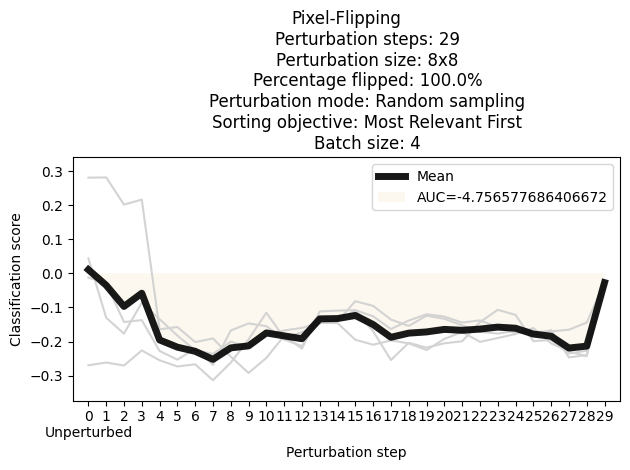

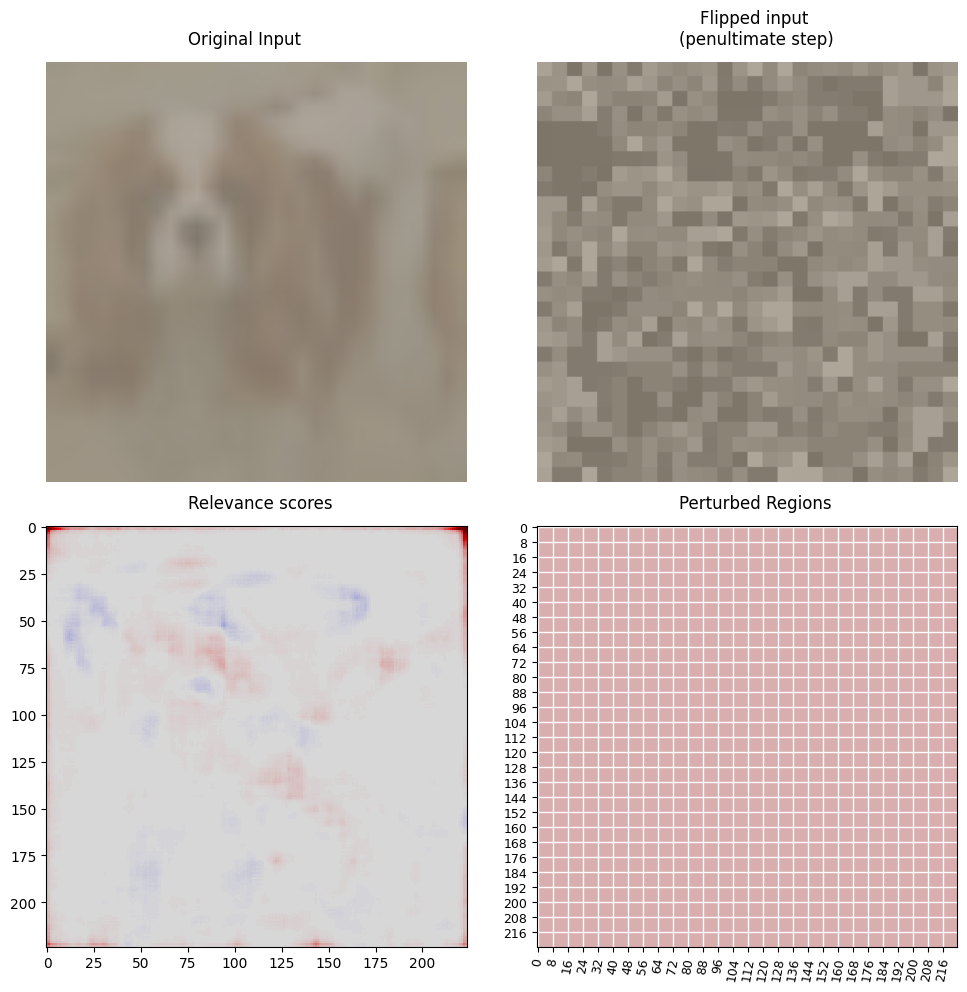

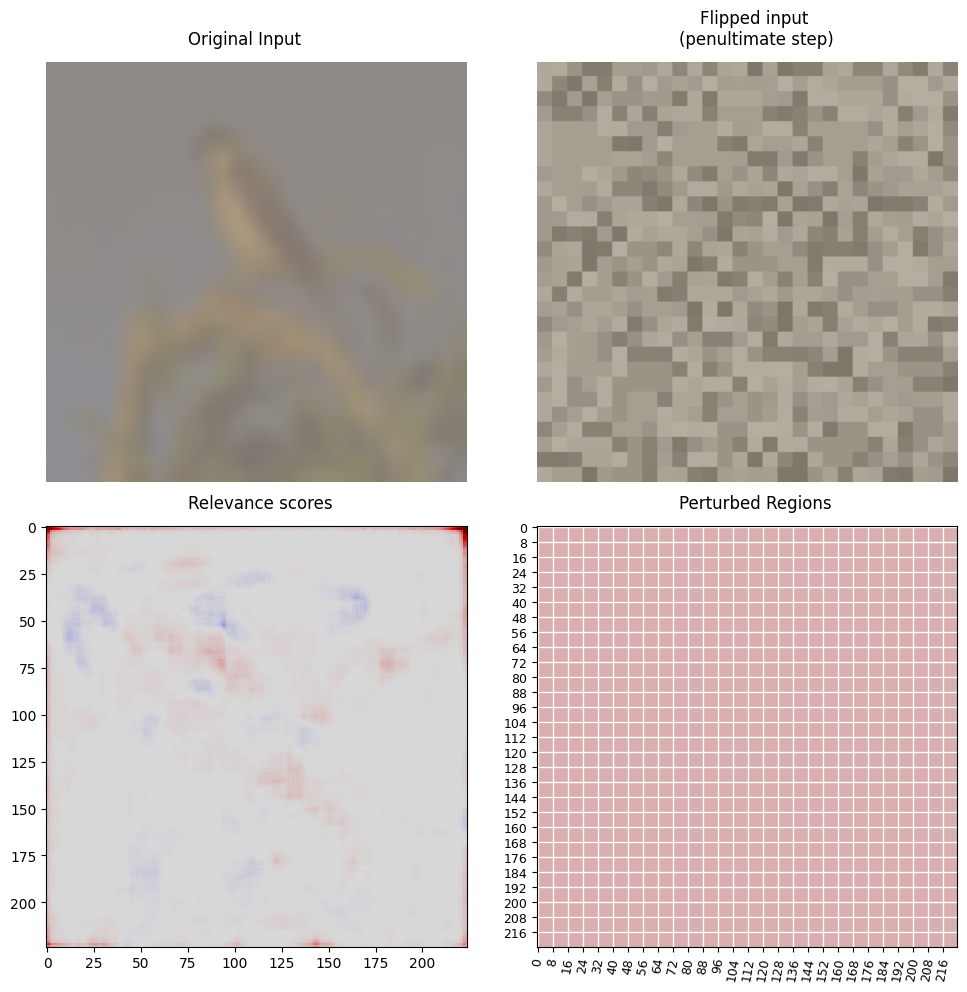

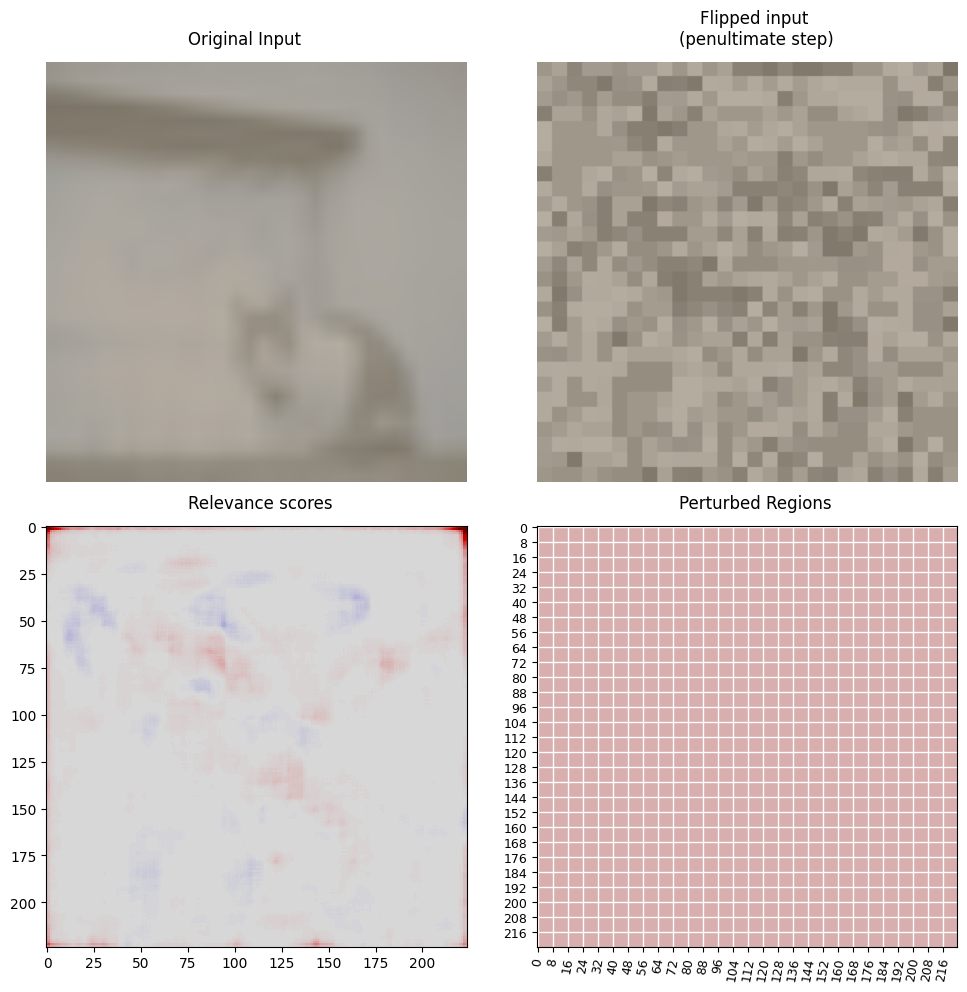

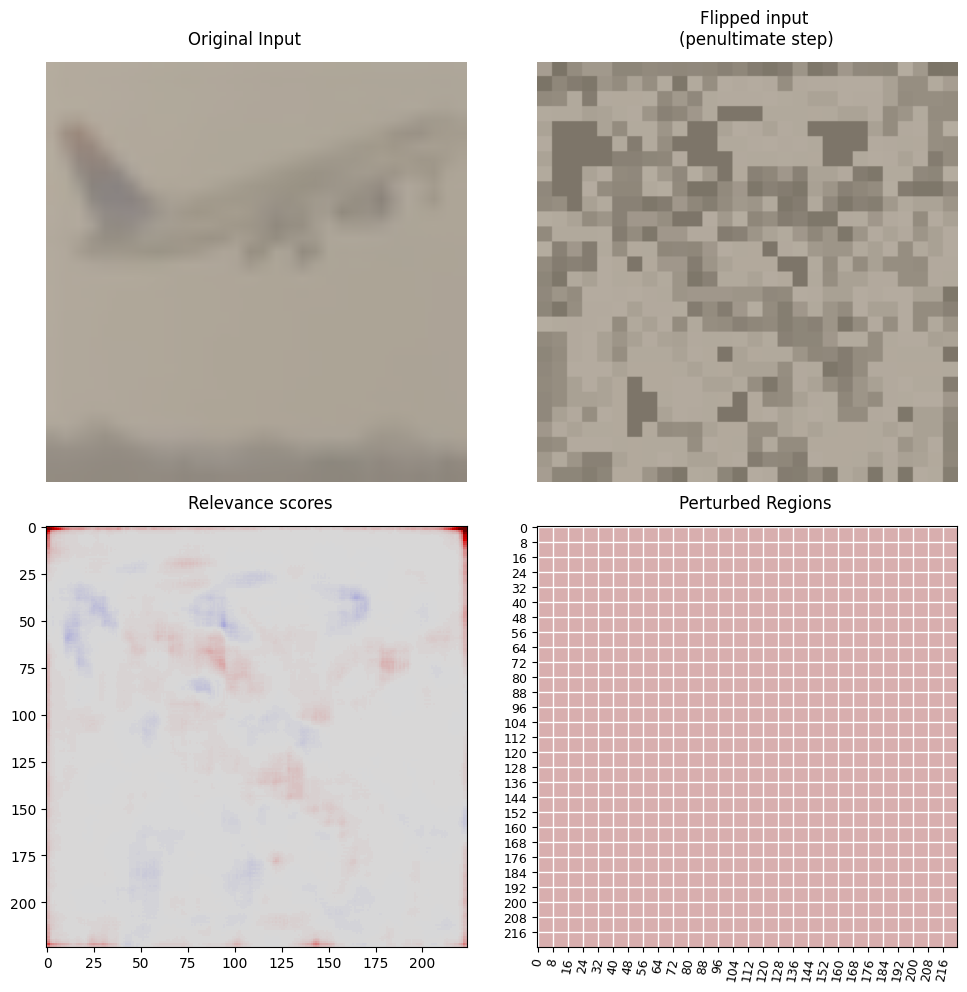

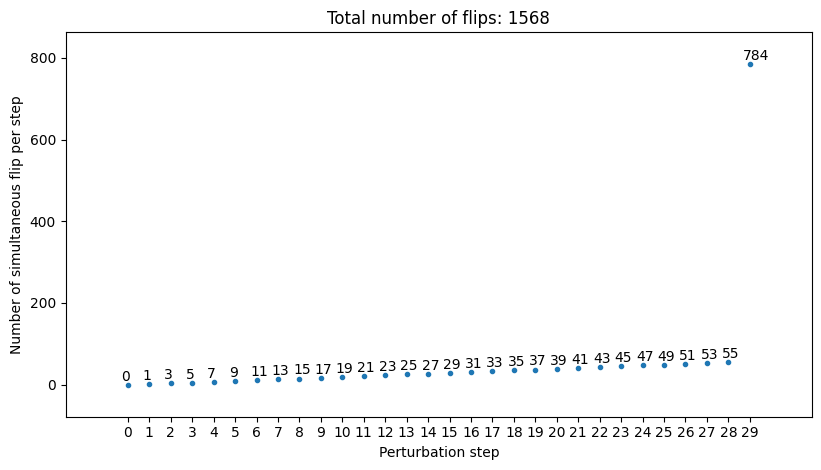

In [24]:
from pf.core import PixelFlipping
from pf.perturbation_modes.constants import PerturbModes
from typing import Callable

# Set parameters for the Pixel-Flipping algorithm
perturbation_steps: int = 29
perturbation_size: int = 8
perturb_mode: str = PerturbModes.RANDOM  # or PerturbModes.RANDOM

# Create an instance of PixelFlipping
pixel_flipping_instance: PixelFlipping = PixelFlipping(
    perturbation_steps=perturbation_steps,
    perturbation_size=perturbation_size,
    perturb_mode=perturb_mode
)

# Clone the input and relevance scores
input_nchw: torch.Tensor = images.clone().detach()
relevance_scores_nchw: torch.Tensor = R.clone().detach()

# Function to return the classification score for the given input
# Adjust the index for CIFAR-10 classes (0 to 9)

# Example for class 'Cat' with index 3
class_index = 3  # Adjust this index based on the class you want to analyze


def forward_pass(input_nchw): 
    return model(input_nchw)[:, class_index] 


# Run the Pixel-Flipping algorithm
pixel_flipping_instance(input_nchw, relevance_scores_nchw, forward_pass)

# Plot the results
pixel_flipping_instance.plot_class_prediction_scores()
pixel_flipping_instance.plot_image_comparison()
pixel_flipping_instance.plot_number_of_flips_per_step()